In [1]:
here::i_am("rna_atac/mofa/03_plot_mofa_results.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressMessages(library(MOFA2))
suppressMessages(library(batchelor))

######################
## Define arguments ##
######################

# p <- ArgumentParser(description='')
# p$add_argument('--metadata',        type="character",                               help='Cell metadata file')
# p$add_argument('--mofa_model',        type="character",                               help='MOFA model')
# p$add_argument('--batch_correction', type="character", default="False",                                 help='Batch correction (MNN)?')
# p$add_argument('--outdir',        type="character",                               help='Output directory')

# args <- p$parse_args(commandArgs(TRUE))

## START TEST ##
# args$metadata <- file.path(io$basedir,"results/rna_atac/mofa/remove_ExE_cells_True/sample_metadata.txt.gz")
# args$mofa_model <- file.path(io$basedir,"results/rna_atac/mofa/remove_ExE_cells_True/mofa.hdf5")
# args$batch_correction <- "True"
# args$outdir <- file.path(io$basedir, sprintf("results/rna_atac/mofa/remove_ExE_cells_True/batch_correction_%s/pdf",args$batch_correction))
## END TEST ##

## START TEST ##
args = list()
args$metadata <- file.path(io$basedir,"results/rna_atac/mofa/sample_metadata.txt.gz")
args$mofa_model <- file.path(io$basedir,"results/rna_atac/mofa/MOFA_model.hdf5")
args$outdir = file.path(io$basedir,"results/rna_atac/mofa/")
args$batch_correction = 'False'
## END TEST ##

dir.create(args$outdir, showWarnings = F, recursive = T)



here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [2]:
#####################
## Parse arguments ##
#####################

if (args$batch_correction=="True") {
  args$batch_correction <- TRUE
} else if (args$batch_correction=="False") {
  args$batch_correction <- FALSE 
} else {
  stop('batch_correction should be "True" or "False"')
}

# I/O
#dir.create(args$outdir, showWarnings=F)

In [3]:
##########################
## Load sample metadata ##
##########################

sample_metadata <- fread(args$metadata)

In [4]:
###############
## Load MOFA ##
###############

if (tools::file_ext(args$mofa_model)=="rds") {
  MOFAobject <- readRDS(args$mofa_model)
} else if (tools::file_ext(args$mofa_model)=="hdf5") {
  MOFAobject <- load_model(args$mofa_model, load_data = F)
  
  # Add sample metadata
  cells <- as.character(unname(unlist(MOFA2::samples_names(MOFAobject))))
  sample_metadata_to_mofa <- copy(sample_metadata) %>%
    setnames("cell","sample") %>%
    .[sample%in%cells] %>% setkey(sample) %>% .[cells]
  stopifnot(all(cells==sample_metadata_to_mofa$cell))
  samples_metadata(MOFAobject) <- sample_metadata_to_mofa
}

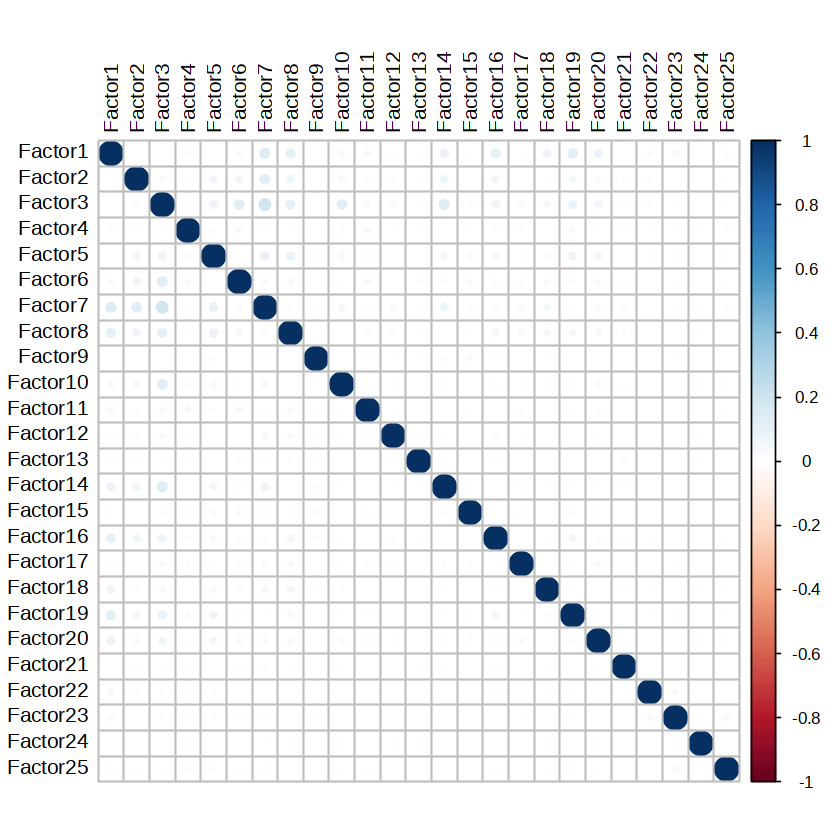

In [5]:
#################################
## Correlation between factors ##
#################################

plot_factor_cor(MOFAobject)

In [6]:
#############################
## Plot variance explained ##
#############################

p <- plot_variance_explained(MOFAobject, plot_total = T)[[2]]

pdf(sprintf("%s/mofa_var_explained_total.pdf",args$outdir), width=6, height=3)
print(p)
dev.off()

p <- plot_variance_explained(MOFAobject, factors = 1:MOFAobject@dimensions$K, x="view", y="factor", max_r2 = 5) +
  theme(legend.position = "top")

pdf(sprintf("%s/mofa_var_explained.pdf",args$outdir), width=6, height=8)
print(p)
dev.off()

######################
## Batch correction ##
######################

# Select factors to use 
factors.to.use <- 1:get_dimensions(MOFAobject)[["K"]]
# factors.to.use <- factors.to.use[!factors.to.use%in%c("3")]
# factors.to.use <- c(1,2,3,6,7)

# Extract factors
Z <- get_factors(MOFAobject, factors=factors.to.use)[[1]]

if (args$batch_correction) {
  
  # Define stage and sample order
  timepoints <- MOFAobject@samples_metadata$stage
  timepoint_order <- opts$stages[opts$stages%in%timepoints]
  samples <- MOFAobject@samples_metadata$batch
  sample_order <- opts$samples[opts$samples%in%samples]
    
  Z_list    <- lapply(unique(timepoints), function(i){
    sub_pc   <- Z[timepoints == i, , drop = FALSE]
    sub_samp <- samples[timepoints == i]
    list     <- lapply(unique(sub_samp), function(j){ sub_pc[sub_samp == j, , drop = FALSE]})
    names(list) <- unique(sub_samp)
    return(list)
  })
  names(Z_list) <- unique(timepoints)
  
  #arrange to match timepoint order
  Z_list <- Z_list[order(match(names(Z_list), timepoint_order))]
  Z_list <- lapply(Z_list, function(x){ x[order(match(names(x), sample_order))]})
  
  #perform corrections within stages
  correct_list <- lapply(Z_list, function(x){
    if(length(x) > 1){
      return(do.call(reducedMNN, x)$corrected)
    } else {
      return(x[[1]])
    }
  })
  
  #perform correction over stages
  Z_corrected <- reducedMNN(correct_list, merge.order=1:length(correct_list))$corrected 
  # colnames(Z_corrected) <- colnames(Z)
} else {
  Z_corrected <- Z
}

# Save factors
factors.dt <- Z_corrected %>% round(3) %>% as.data.table(keep.rownames = T) %>% setnames("rn","cell")
fwrite(factors.dt, sprintf("%s/factors.txt.gz",args$outdir))

##########
## UMAP ##
##########

# Run
umap.mtx <- uwot::umap(Z_corrected, n_neighbors=25, min_dist=0.50, metric="cosine")
umap.dt <- umap.mtx %>% round(3) %>% as.data.table(keep.rownames = T) %>% setnames("rn","cell")
fwrite(umap.dt, file.path(args$outdir,"umap.txt.gz"))

# Plot
to.plot <- umap.dt %>%
  .[,sample:=rownames(Z_corrected)] %>%
  merge(MOFAobject@samples_metadata[,c("sample","day","Clusters_PeakMatrix2")] %>% as.data.table)

p <- ggplot(to.plot, aes(x=V1, y=V2, col=Clusters_PeakMatrix2)) +
  # geom_point(size=1, shape=21, stroke=0.1) +
  ggrastr::geom_point_rast(size=1) +
  #scale_fill_manual(values=opts$celltype.colors) +
  guides(color = guide_legend(override.aes = list(size=2))) +
  theme_classic() +
  ggplot_theme_NoAxes() +
  theme(
    legend.position="none"
  )

pdf(sprintf("%s/mofa_umap_Clusters_PeakMatrix2.pdf",args$outdir), width=7, height=5)
print(p)
dev.off()

p <- ggplot(to.plot, aes(x=V1, y=V2, col=day)) +
  ggrastr::geom_point_rast(size=1) +
  scale_color_manual(values=opts$days.colors) +
  guides(color = guide_legend(override.aes = list(size=2))) +
  theme_classic() +
  ggplot_theme_NoAxes() +
  theme(
    legend.position="top",
    legend.title = element_blank()
  )

pdf(sprintf("%s/mofa_umap_day.pdf",args$outdir), width=7, height=5)
print(p)
dev.off()

png 
  2

png 
  2

png 
  2

png 
  2

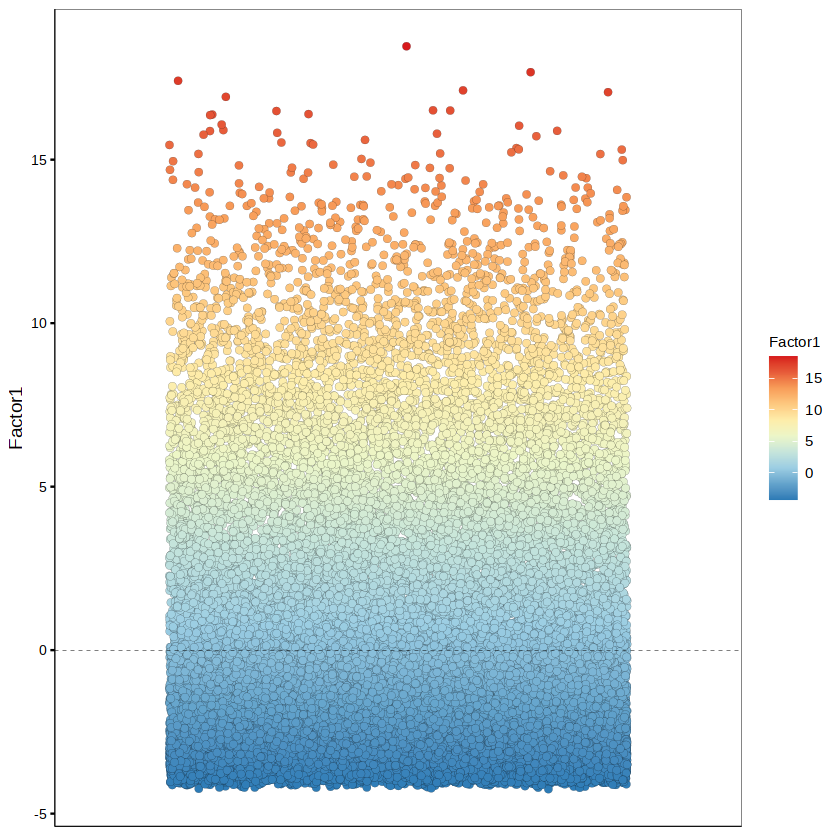

In [7]:
plot_factor(MOFAobject, 
  factors = 1, 
  color_by = "Factor1"
)

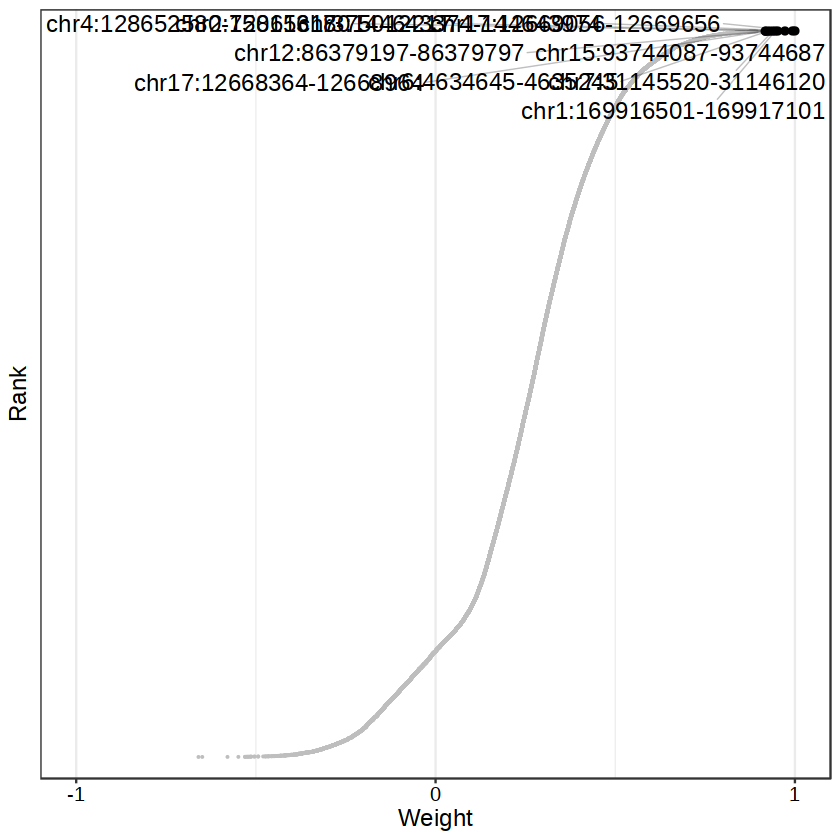

In [8]:
plot_weights(MOFAobject,
 view = "ATAC",
 factor = 1,
 nfeatures = 10,     # Top number of features to highlight
 scale = T           # Scale weights from -1 to 1
)

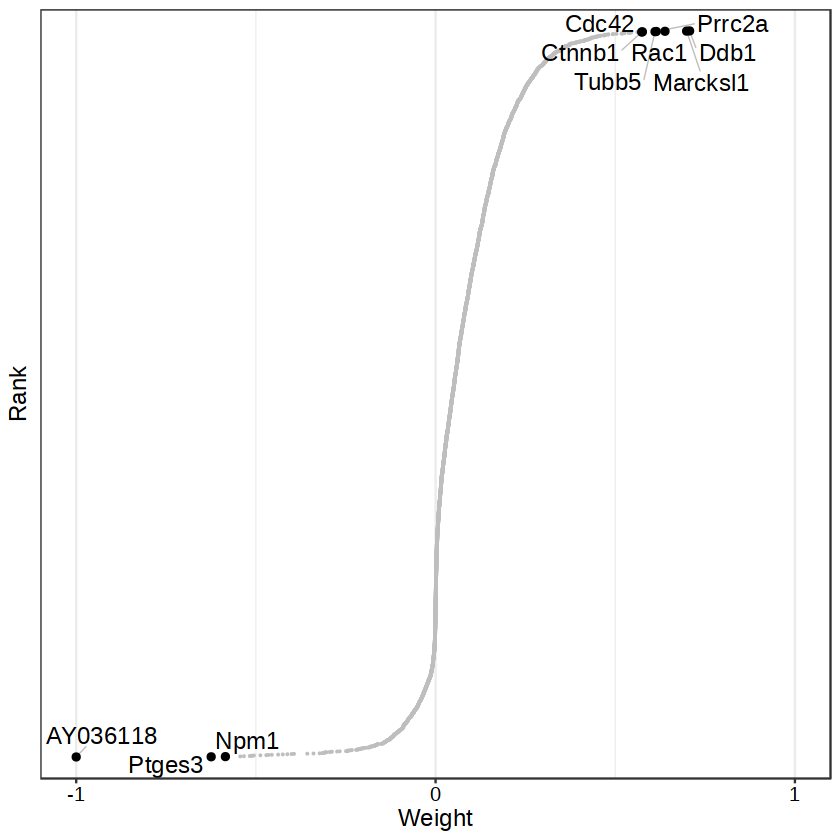

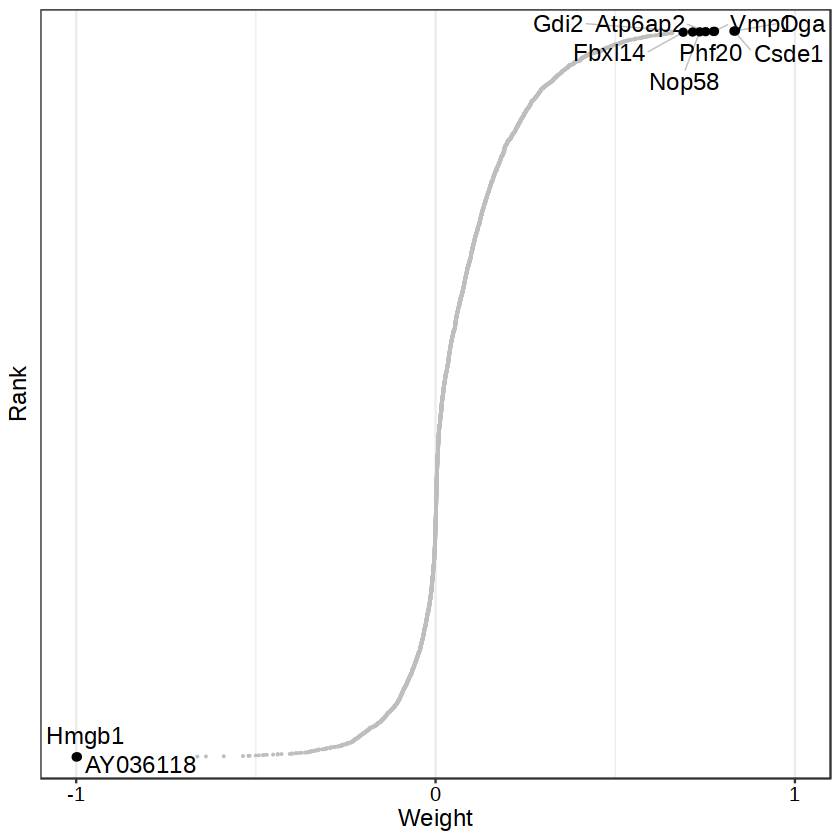

In [9]:
plot_weights(MOFAobject,
 view = "RNA",
 factor = 1,
 nfeatures = 10,     # Top number of features to highlight
 scale = T           # Scale weights from -1 to 1
)

plot_weights(MOFAobject,
 view = "RNA",
 factor = 2,
 nfeatures = 10,     # Top number of features to highlight
 scale = T           # Scale weights from -1 to 1
)

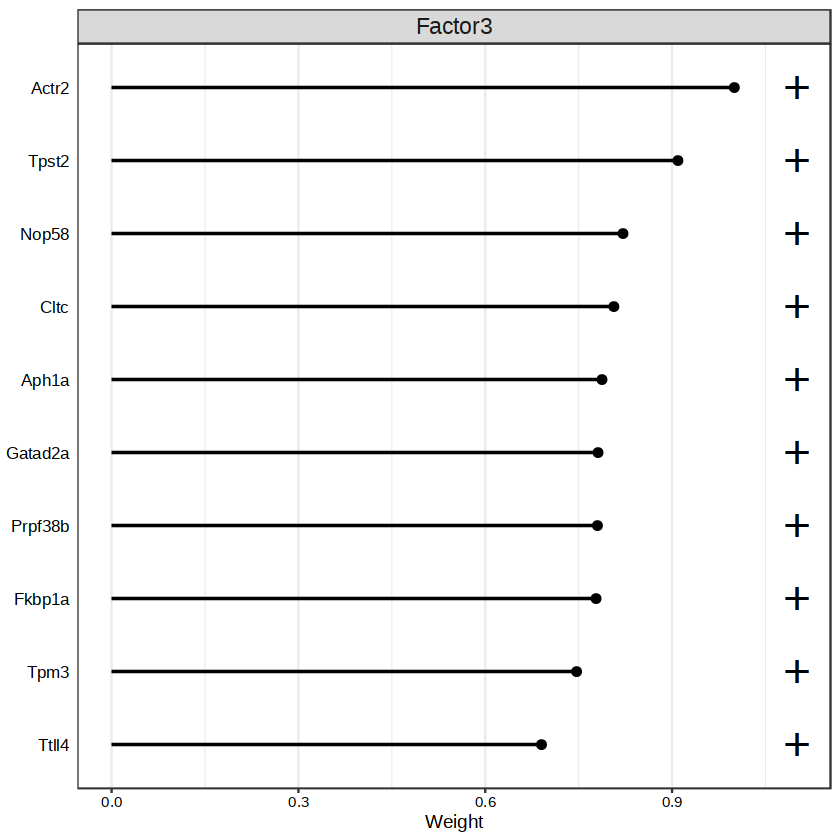

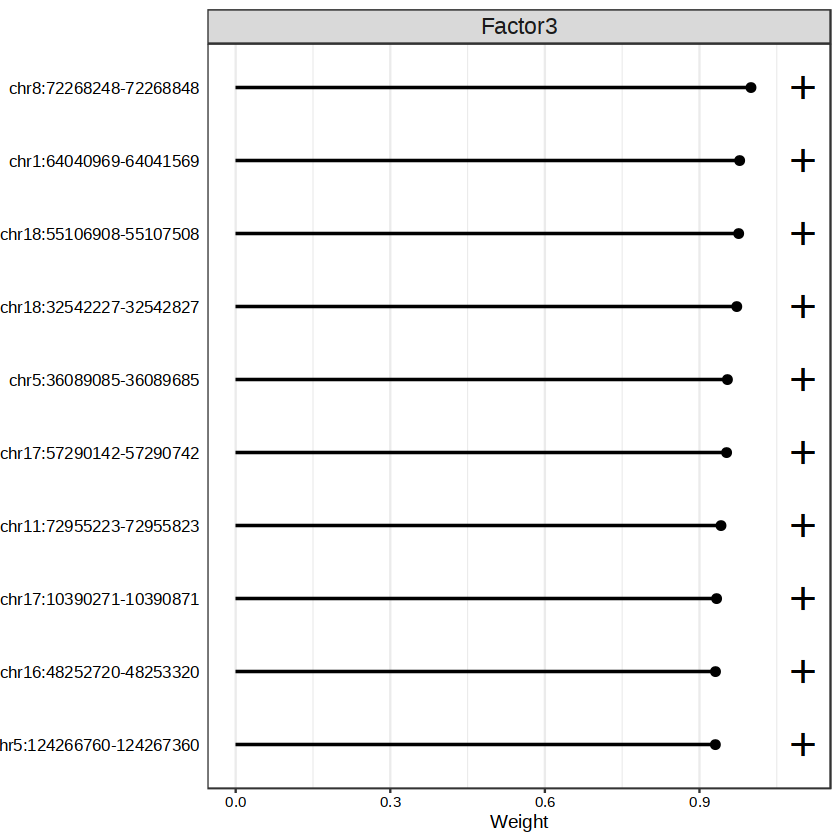

In [10]:
plot_top_weights(MOFAobject,
 view = "RNA",
 factor = 3,
 nfeatures = 10,     # Top number of features to highlight
 scale = T           # Scale weights from -1 to 1
)

plot_top_weights(MOFAobject,
 view = "ATAC",
 factor = 3,
 nfeatures = 10,     # Top number of features to highlight
 scale = T           # Scale weights from -1 to 1
)

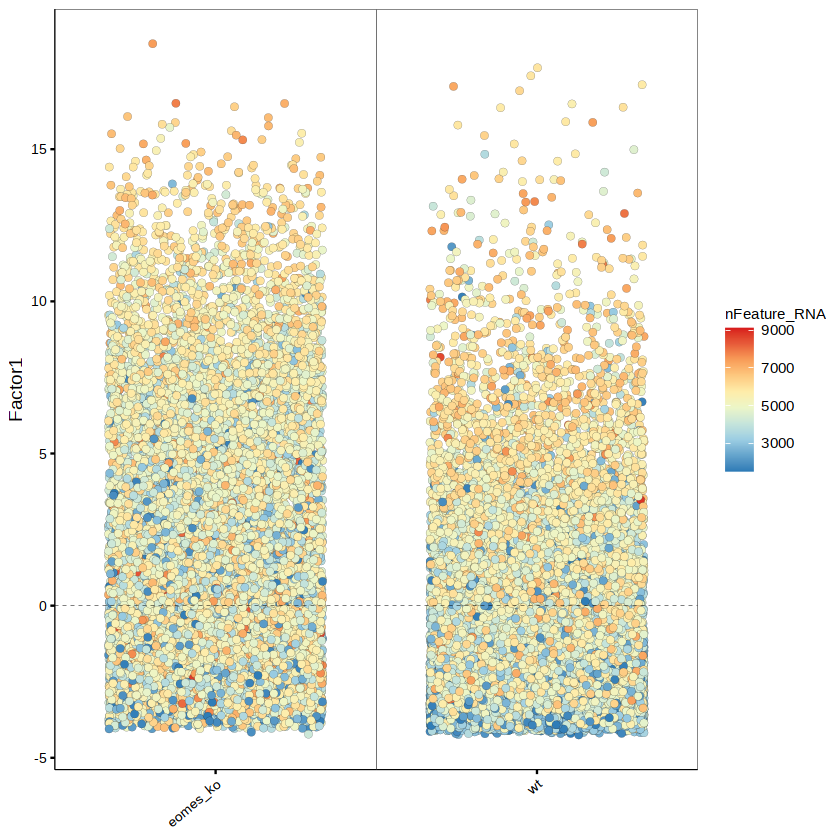

In [16]:
plot_factor(MOFAobject, factors=1, group_by = "genotype", color_by="nFeature_RNA") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )

In [12]:
MOFAobject@samples_metadata$exp = str_replace_all(MOFAobject@samples_metadata$`sample.1`, opts$sample2exp)

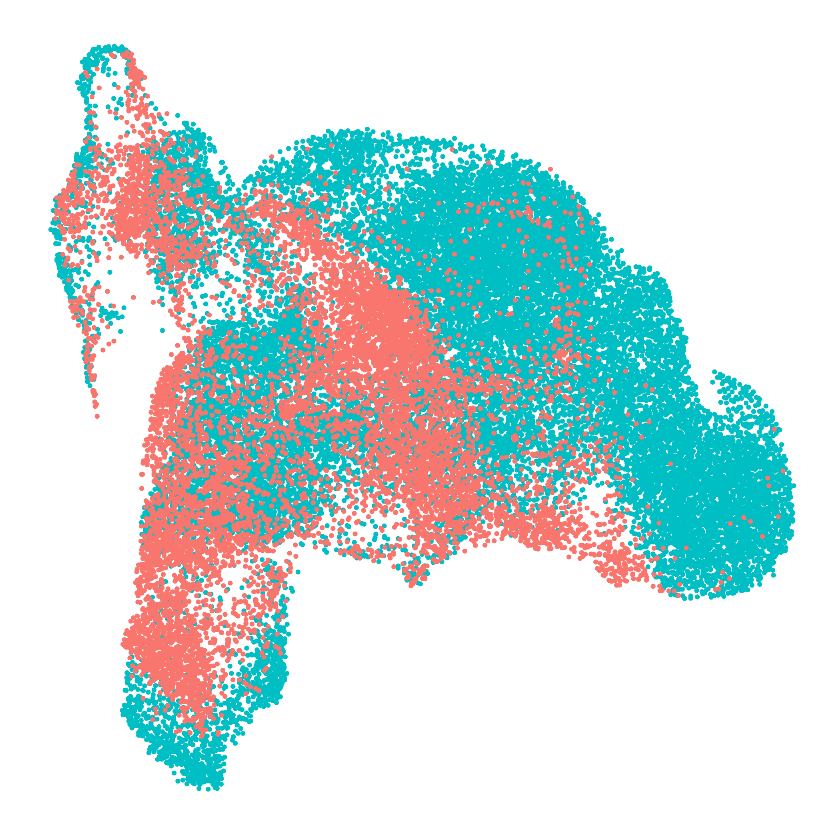

In [13]:
# Plot
to.plot <- umap.dt %>%
  .[,sample:=rownames(Z_corrected)] %>%
  merge(MOFAobject@samples_metadata[,c("sample","day","Clusters_PeakMatrix2", "exp")] %>% as.data.table)

p <- ggplot(to.plot, aes(x=V1, y=V2, col=exp)) +
  # geom_point(size=1, shape=21, stroke=0.1) +
  ggrastr::geom_point_rast(size=0.5) +
  #scale_fill_manual(values=opts$celltype.colors) +
  guides(color = guide_legend(override.aes = list(size=2))) +
  theme_classic() +
  ggplot_theme_NoAxes() +
  theme(
    legend.position="none"
  )
p

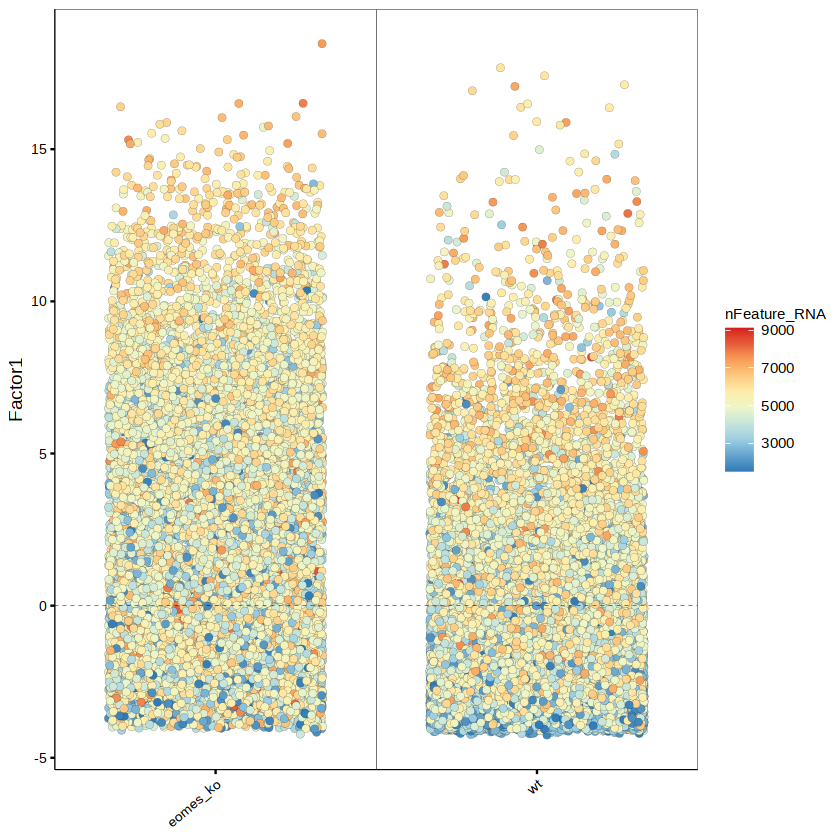

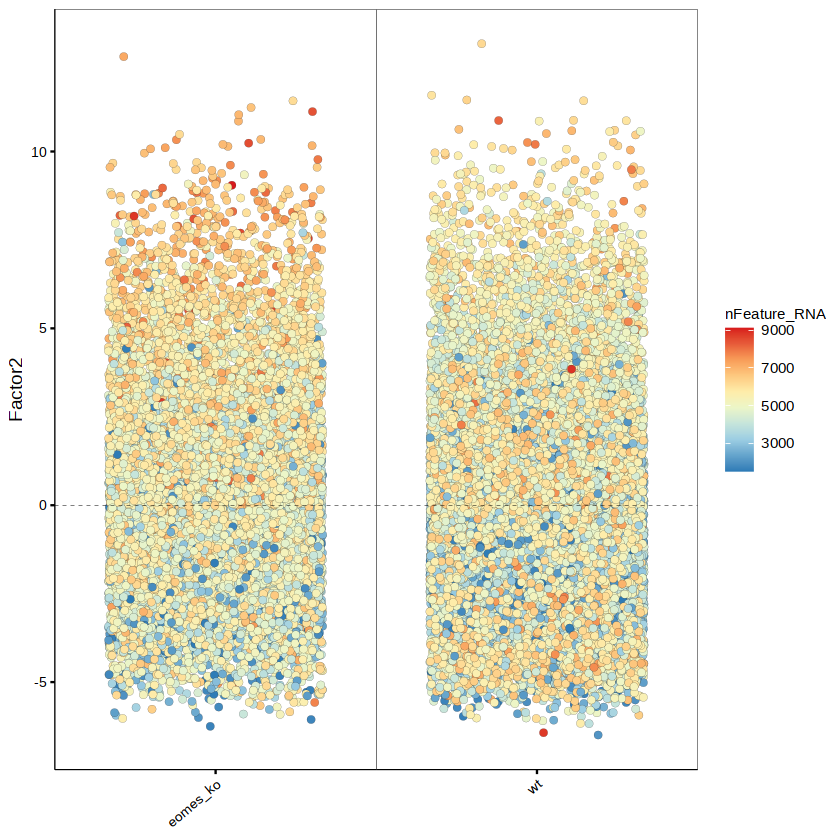

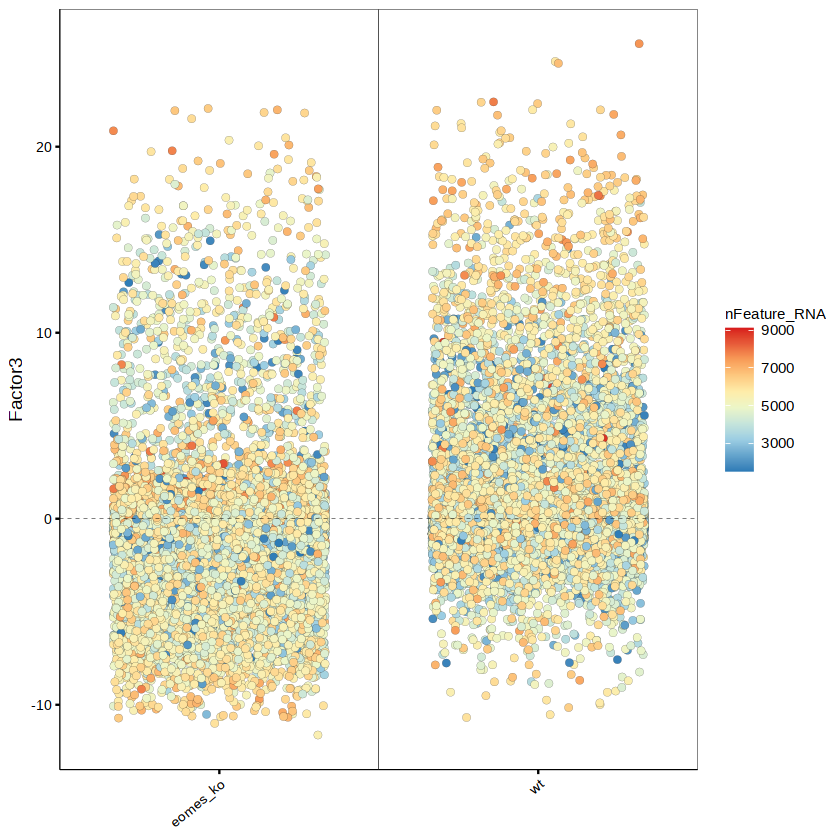

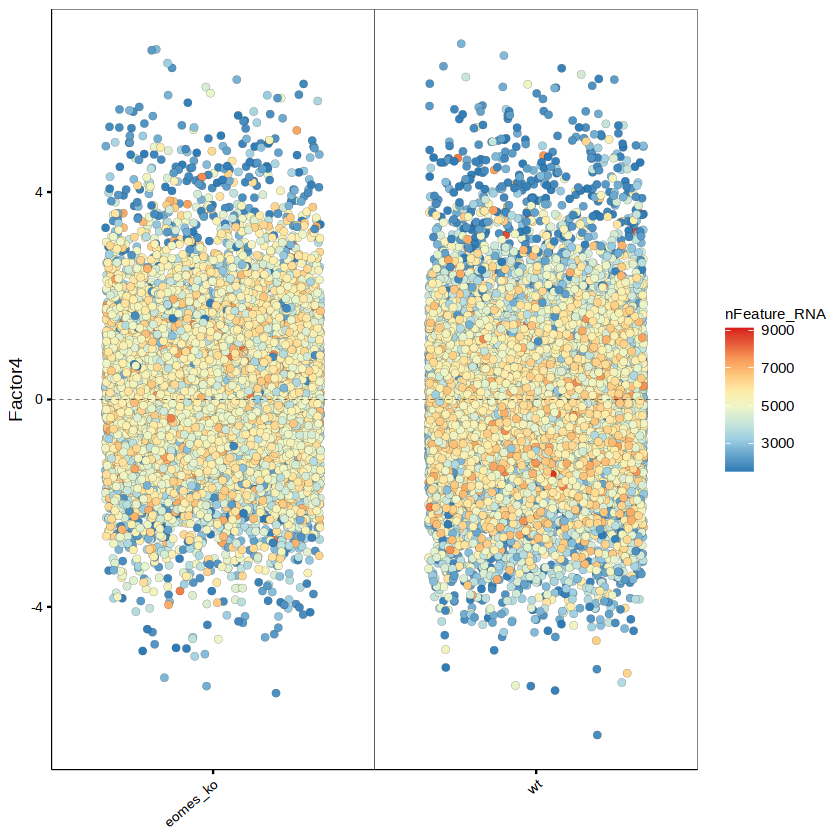

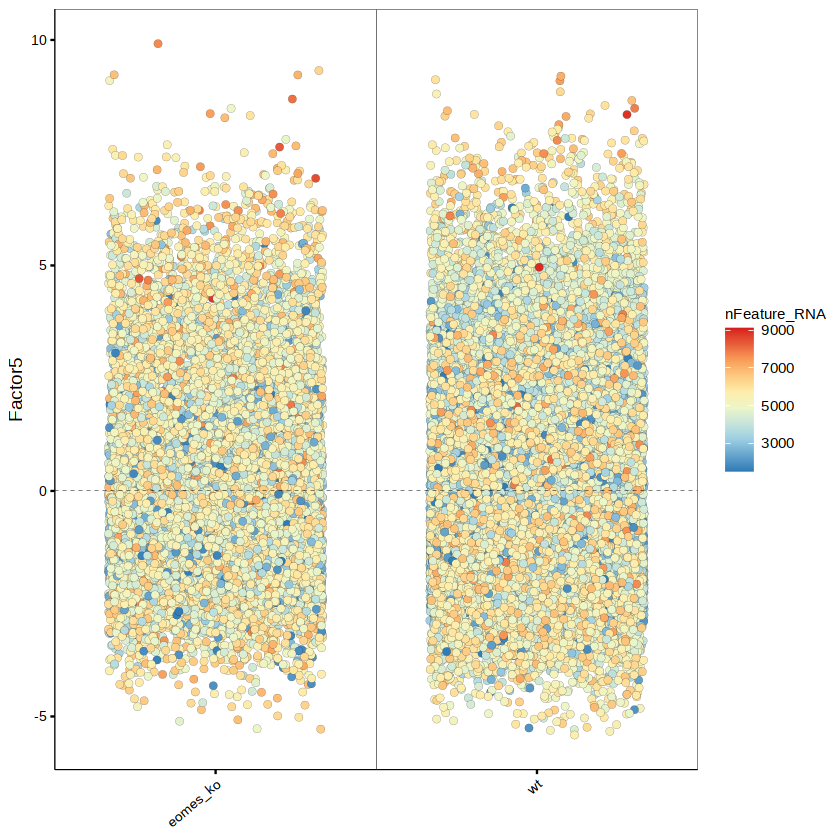

...

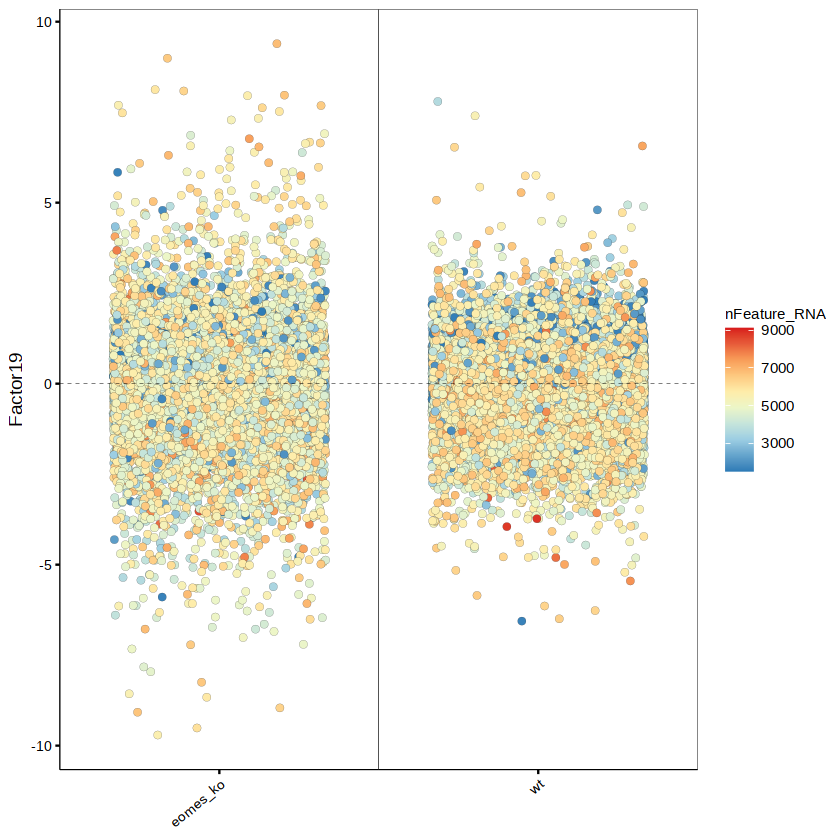

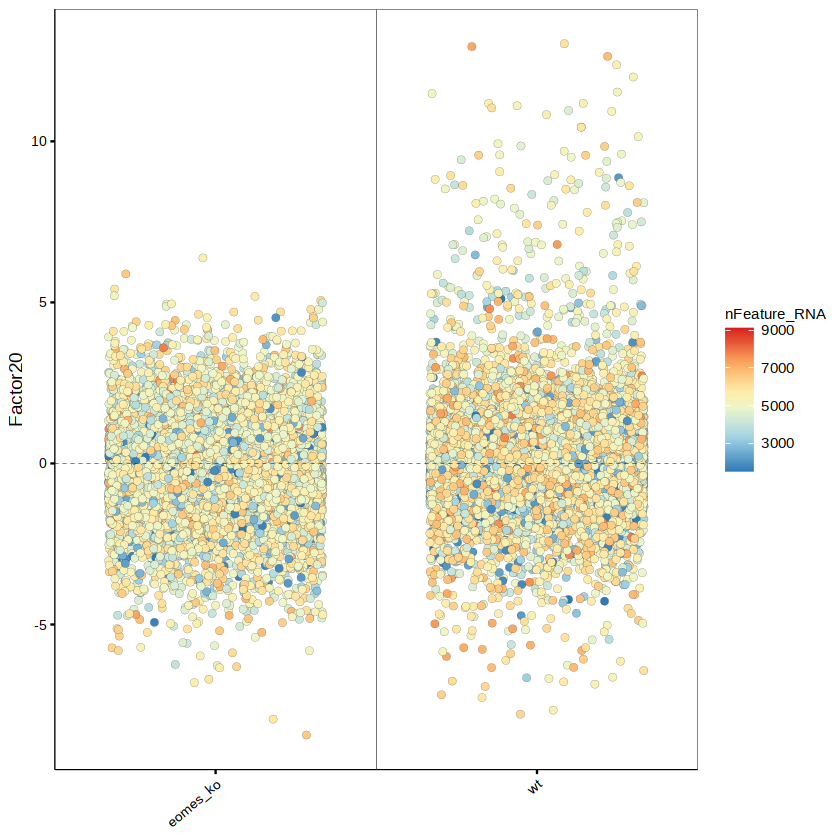

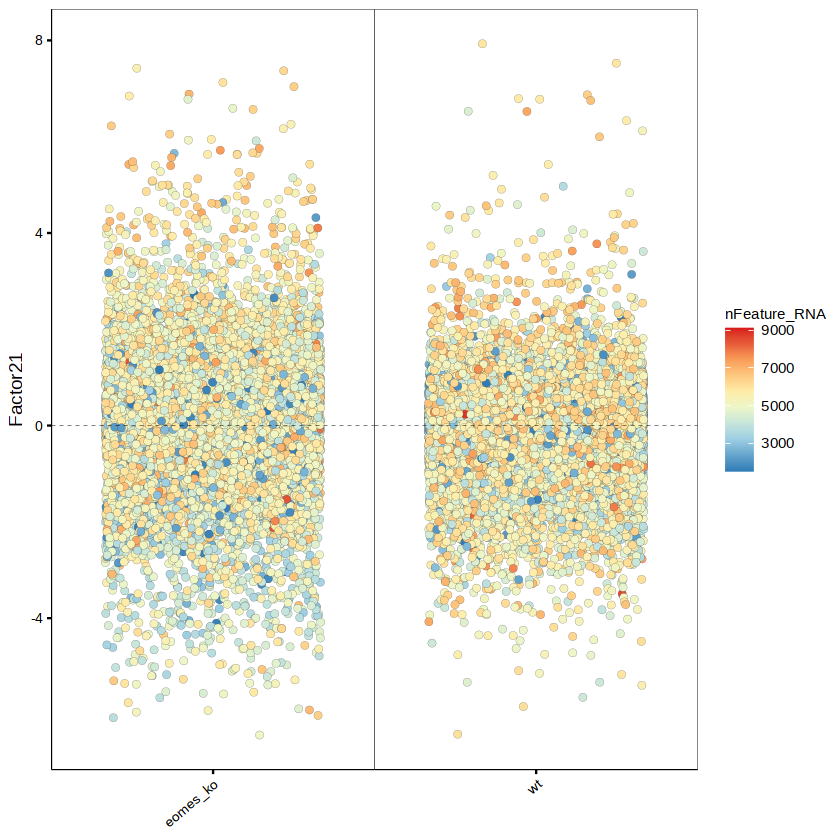

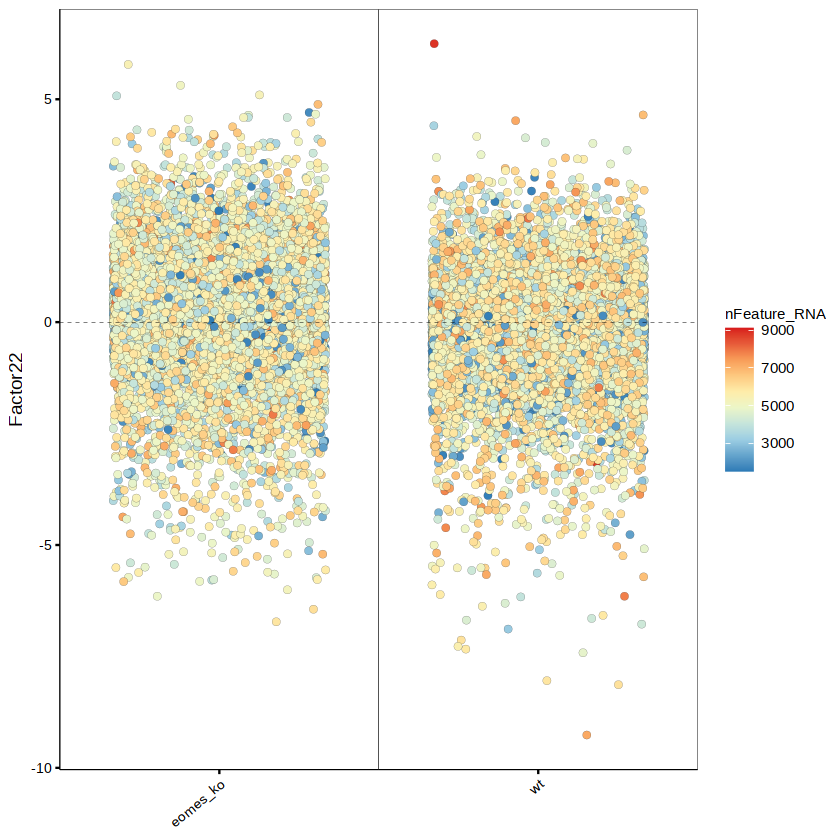

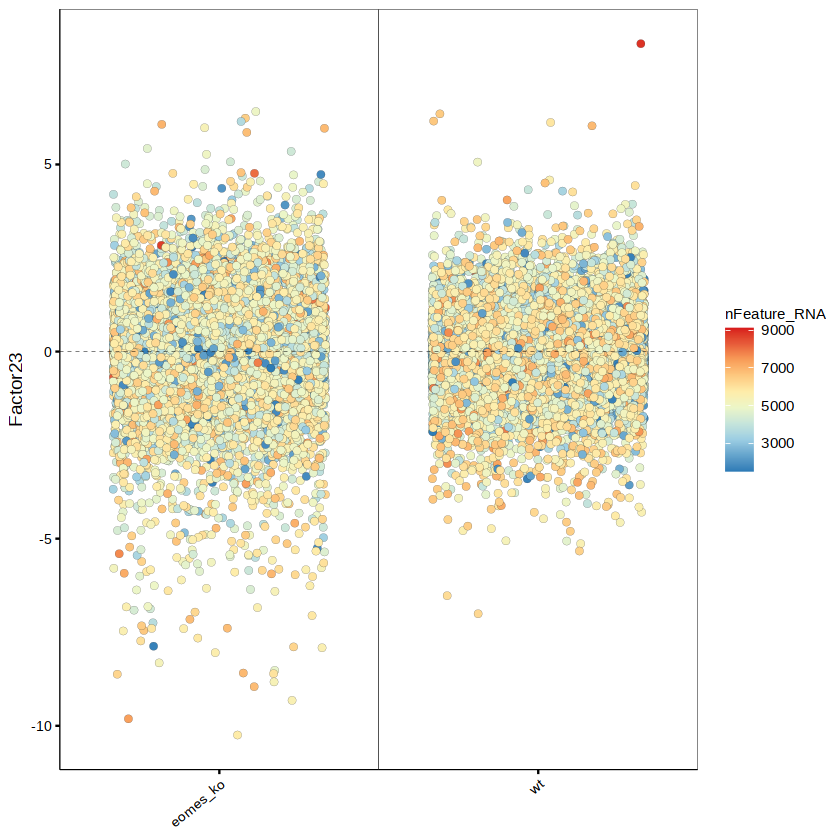

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]


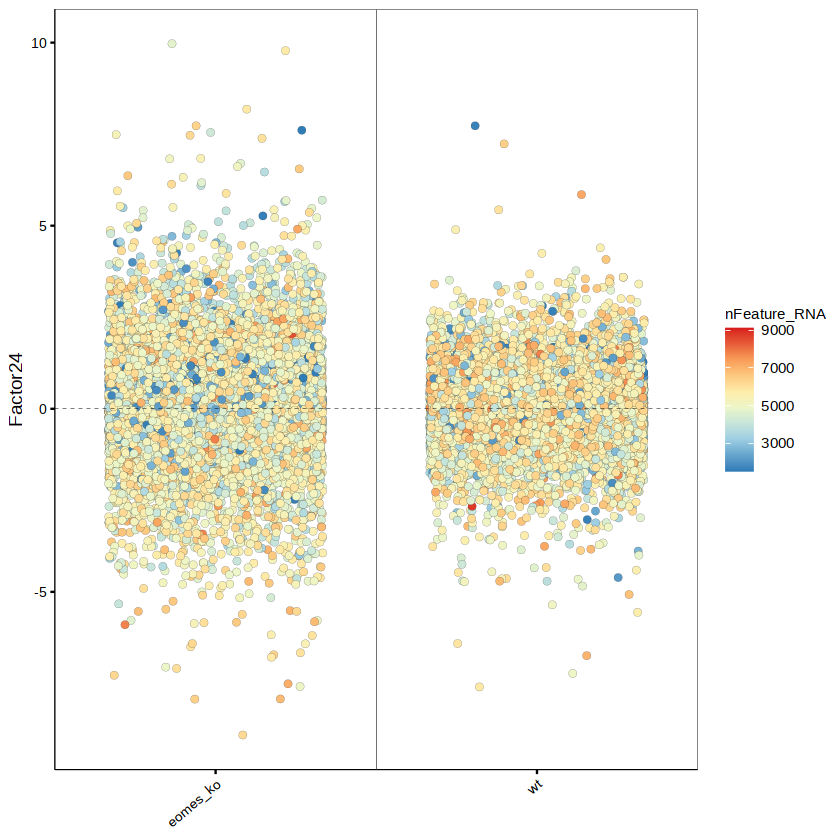

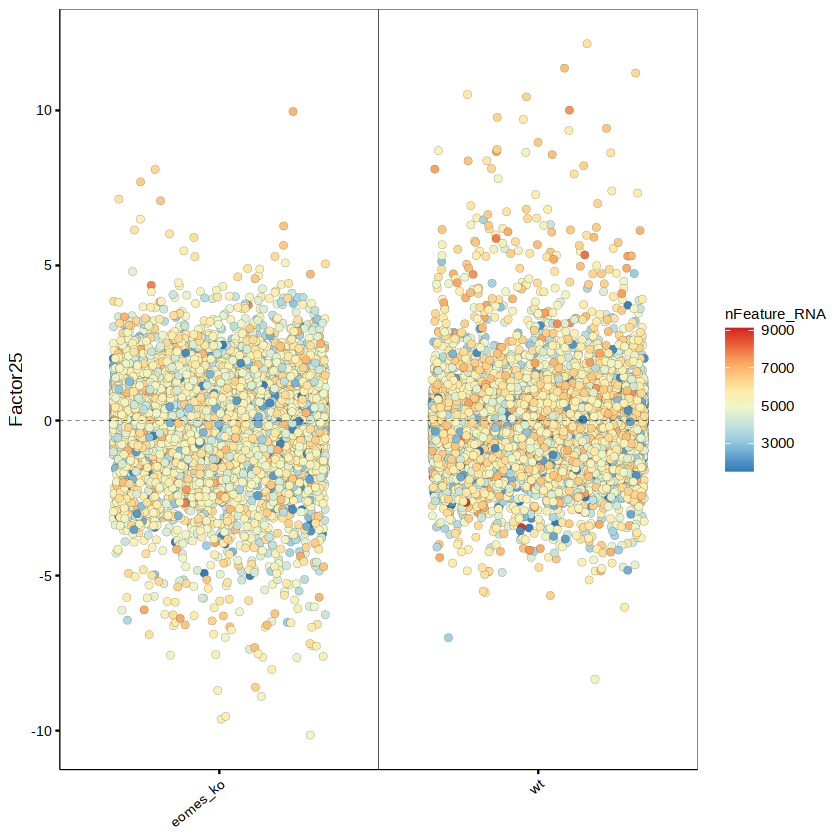

In [17]:
lapply(1:25, function(x){
    plot_factor(MOFAobject, factors=x, group_by = "genotype", color_by="nFeature_RNA") +
      theme(
        axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
      )
})